In [83]:
import graph_ruggedness_de
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import networkx as nx
from scipy.stats import spearmanr
import matplotlib as mpl
from collections import defaultdict
import gaussian_markov_random_field
import sequence_evolution
import random
import matplotlib.patches as patches
import seaborn as sns
import scipy.stats as stats
import statsmodels.stats.multicomp as mc
from timestep_opt import fit_t_bayesian_laplace, compute_bayes_factor
import nk_landscape

## Figure 3
The purpose of figure 3 is to demonstrate how sparisty in the fitness landscapes ofscuates ruggedness measurements. This is done within the His3p experimental dataset and simulated NK landscapes.

## Empirical data: His3p with subgraph sampling

The below cell constructs the His3p fitness landscape using the `graph_ruggedness_de.build_ohe_graph` function, and then samples incomplete subgraphs with `sampling_prop` sampling proportions from this using the `graph_ruggedness_de.sample_graph` function. 

In [2]:
df = pd.read_csv('../data_files/his3p//His3p_combinatorial.csv')
seq_ls = df['sequences'].tolist()
values = df['fitness'].tolist()
scaler = MinMaxScaler()
values = [val[0] for val in (scaler.fit_transform(np.array(values).reshape(-1,1)))]

G_k = graph_ruggedness_de.build_ohe_graph(seq_ls=seq_ls,
                                        values=values,
                                        edges=False,
                                        hamming_edges=False, 
                                        approximate=True,
                                        n=int(np.sqrt(len(df))))

sampling_props = np.linspace(0.1, 0.9, 10)
replicates = 10

#Netowork graph dicts
graph_sampl_repl_dict = {}
h0_prior_arr_sampl_repl_dict = {}
h1_prior_arr_sampl_repl_dict = {}

#Iterate through sampling proportions.
for sampling_prop in sampling_props:
    
    #Iterate through replicates.
    for replicate in range(replicates):

        try:
            G_sampled, sampled_nodes, sampled_values = graph_ruggedness_de.sample_graph(G=G_k,
                                                                                        sample_size=sampling_prop)

            graph_ruggedness_de.add_ohe_knn_edges_approx(G=G_sampled,
                                                        k=int(np.sqrt(G_sampled.number_of_nodes())))
            #Save to dict.
            graph_sampl_repl_dict[(sampling_prop, replicate)] = G_sampled

        except:
            continue

Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 3369.59it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 69202.76it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4560.33it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 60948.81it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4481.92it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 61470.61it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4346.88it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 56176.20it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4519.12it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 68921.29it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4131.47it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 30453.59it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4200.98it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 71806.88it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4426.73it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 60621.74it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4486.72it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 65308.67it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 202it [00:00, 4478.63it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 202it [00:00, 56660.83it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 2777.98it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 68031.10it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4544.59it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 66565.22it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4169.57it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 55823.00it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 3474.87it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 29110.22it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 3158.16it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 19958.24it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4163.95it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 61348.80it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4393.97it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 50935.96it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4366.20it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 64205.37it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4409.35it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 38312.82it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 383it [00:00, 4490.51it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 383it [00:00, 66900.65it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4627.61it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 61248.98it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4640.88it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 60701.07it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4259.06it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 60740.11it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4538.68it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 61563.55it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4311.61it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 56508.88it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 3114.32it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 54762.02it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4655.89it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 54186.49it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4694.02it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 4588.09it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 3511.49it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 35322.70it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 563it [00:00, 4280.97it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 563it [00:00, 51242.18it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4312.74it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 47379.22it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4283.01it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 54169.44it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4598.52it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 54427.72it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4608.41it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 53537.56it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4587.10it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 52280.16it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4410.65it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 53040.95it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4331.21it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 52040.94it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4629.69it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 53326.85it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4558.43it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 51734.25it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 743it [00:00, 4647.65it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 743it [00:00, 54959.49it/s]

Connecting components


Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4154.46it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 923it [00:00, 45077.46it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4675.00it/s]

Building approx. NN search tree(s).


Done.


Adding approximate KNN edges.: 923it [00:00, 46710.78it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4734.06it/s]

Building approx. NN search tree(s).


Done.


Adding approximate KNN edges.: 923it [00:00, 44101.28it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4600.99it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 923it [00:00, 47679.57it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4612.69it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 923it [00:00, 46836.23it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4725.67it/s]

Building approx. NN search tree(s).


Done.


Adding approximate KNN edges.: 923it [00:00, 49994.74it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4662.80it/s]

Building approx. NN search tree(s).


Done.


Adding approximate KNN edges.: 923it [00:00, 18202.49it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4228.90it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 923it [00:00, 5937.55it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4575.11it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 923it [00:00, 44262.63it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 923it [00:00, 4438.44it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 923it [00:00, 46569.18it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4541.86it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 48258.12it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4701.65it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 49007.90it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4663.22it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 36878.88it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4728.48it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 46607.13it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 3594.26it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 30560.60it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4286.41it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 39757.80it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4671.65it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 46464.49it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4659.31it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 47217.84it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4651.89it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 45018.93it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1104it [00:00, 4781.46it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1104it [00:00, 46763.87it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4666.85it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 37171.28it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4586.63it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 46782.72it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4701.54it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 46638.09it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4584.89it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 44879.80it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4632.43it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 44588.12it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4652.43it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 45976.75it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4672.84it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 43552.87it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4684.03it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 45586.79it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4691.68it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 46242.04it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1284it [00:00, 4692.14it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1284it [00:00, 46300.08it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4690.26it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 44454.22it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4661.35it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 44334.18it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4773.12it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 43859.81it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4582.70it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 43330.26it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4491.93it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 44232.30it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4711.79it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 44463.55it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 3575.70it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 23317.97it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4003.03it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 17834.47it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4066.71it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 7215.85it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1464it [00:00, 4624.94it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1464it [00:00, 44623.50it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4594.64it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 36261.80it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4443.14it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 38806.64it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4661.16it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 41953.50it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4625.20it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 40530.63it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4687.54it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 39540.09it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4333.41it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 36418.47it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4620.88it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 40813.23it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4664.66it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 41358.39it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4752.16it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 42156.13it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1644it [00:00, 4090.10it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1644it [00:00, 41884.19it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4750.72it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 39247.26it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4578.38it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 40963.14it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4725.83it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 40308.26it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4489.75it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 41120.15it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4779.29it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 40719.08it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4735.05it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 40888.71it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4693.14it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 40971.12it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4739.38it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 40564.88it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4612.44it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 41234.37it/s]


Connecting components
Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4783.27it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 41197.10it/s]


Connecting components


The below cell computes the t_map values of subgraphs.

In [3]:
log_likelihood_dict = {}
de_dict = {}

#Iterate through dictionary keys.
for key in graph_sampl_repl_dict.keys():
    log_likelihoods = []
    des = []
    
    #Extract graph from dictionary.
    G_sampled = graph_sampl_repl_dict[key]

    #Determine the sample Dirichlet energy
    sampled_de = graph_ruggedness_de.compute_dirichlet_energy_approximate(G=G_sampled)/G_sampled.number_of_edges()
    des.append(sampled_de)

    t_map, ci_lower, ci_upper, logpost_map, _ = fit_t_bayesian_laplace(G=graph_sampl_repl_dict[key], t_max=100, t_min=0.1)
    #Append total landscape Log(P).
    
    log_likelihoods.append(t_map)

    #Update total landscape log(P) dict.
    log_likelihood_dict[key] = np.array(log_likelihoods)
    de_dict[key] = np.array(des)

The below cell repeats the log-likelihood analysis of the complete / ground-truth His3p fitness landscape.

In [5]:
#Construct full graph.
G_k_full = graph_ruggedness_de.build_ohe_graph(seq_ls=seq_ls,
                                        values=values,
                                        edges=False,
                                        hamming_edges=False, 
                                        approximate=True,
                                        n=int(np.sqrt(len(df))))

G_k_full, _, _ = graph_ruggedness_de.sample_graph(G=G_k_full, sample_size=1)

graph_ruggedness_de.add_ohe_knn_edges_approx(G=G_k_full,
                                            k=int(np.sqrt(G_k_full.number_of_nodes())))

#Compute total Dirichlet energy.
de = graph_ruggedness_de.compute_dirichlet_energy(G=G_k_full)

#Compute ground truth log(P)
tru_t_map, ci_lower, ci_upper, logpost_map, fiedler_val = fit_t_bayesian_laplace(G=G_k_full, t_max=100, t_min=0.1)

#Compute local Dirichlet energies over the full graph.
graph_ruggedness_de.compute_local_dirichlet_energy(G=G_k_full,
                                                   approximate=False)

Building approx. NN index.
Done.


Adding OHE vectors to index.: 1706it [00:00, 4541.62it/s]


Building approx. NN search tree(s).
Done.


Adding approximate KNN edges.: 1706it [00:00, 38270.75it/s]


Connecting components


Computing local Dirichlet energy.: 1706it [00:00, 5699.13it/s]


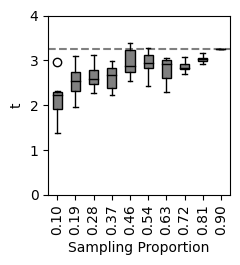

In [6]:
labs = [key for key in log_likelihood_dict.keys()]
vals = [log_likelihood_dict[key] for key in log_likelihood_dict.keys()]

prop_dict = defaultdict(list)

# Collect replicates.
for label, val in zip(labs, vals):
    key = label[0]
    prop_dict[key].append(val[0])


fig, ax = plt.subplots(figsize=(2.5,2.75))
bp = ax.boxplot([val for val in prop_dict.values()],
                labels=[f"{label:.2f}" for label in prop_dict.keys()],
                notch=False,
                patch_artist=True,
                zorder=1)

# Set fill colors for each box
color = 'grey'
for box in bp['boxes']:
    box.set_facecolor(color)

# Set median line color
for median in bp['medians']:
    median.set_color('black')

plt.axhline(tru_t_map, linestyle='--', color='grey', zorder=0)
plt.ylabel('t')
plt.ylim(0, 4)
plt.xlabel('Sampling Proportion')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('../figures/figure_3/panel_a.pdf')
plt.show()

The below cell determins the all-vs-all BF across each sampling proportion to test whether the evidence favours a joint or an indepenent fitness diffusion process.

In [12]:
groups = []
all_vs_all_replicate = 0

for key, values in prop_dict.items():
    groups.extend([key] * len(values))

bfs_dict = {}

for sample_a in set(groups):
    for sample_b in set(groups):
        if sample_a == sample_b:
            bfs_dict[(sample_a, sample_b)] = np.nan
        else:
            graph_a = graph_sampl_repl_dict[(sample_a, 0)]
            graph_b = graph_sampl_repl_dict[(sample_b, 0)]

            BF, log_evidence_H0, log_evidence_H1 = compute_bayes_factor(G1=graph_a,
                                                                        G2=graph_b,
                                                                        t_min=0.1, 
                                                                        t_max=10,
                                                                        verbose=True)
            bfs_dict[(sample_a, sample_b)] = BF


Optimization success: True, t_map=2.2607, f(t_map)=-25.4995
Optimization success: True, t_map=2.5700, f(t_map)=-83.7777
Joint optimization success: True, t_joint_map=2.4594, f(t_joint_map)=-108.8048
Log Evidence (H₀): 107.83803035447465
Log Evidence (H₁): 108.09436834822273
Bayes Factor (BF): 0.7738803578605935
Optimization success: True, t_map=2.2607, f(t_map)=-25.4995
Optimization success: True, t_map=3.1482, f(t_map)=-234.2931
Joint optimization success: True, t_joint_map=2.9388, f(t_joint_map)=-253.8807
Log Evidence (H₀): 252.5463941063295
Log Evidence (H₁): 258.1075950658907
Bayes Factor (BF): 0.003844156947238766
Optimization success: True, t_map=2.2607, f(t_map)=-25.4995
Optimization success: True, t_map=3.1263, f(t_map)=-145.5198
Joint optimization success: True, t_joint_map=2.8512, f(t_joint_map)=-166.1306
Log Evidence (H₀): 164.9728366552747
Log Evidence (H₁): 169.5525937638557
Bayes Factor (BF): 0.010257387425241897
Optimization success: True, t_map=2.2607, f(t_map)=-25.4995

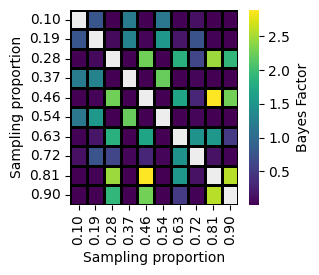

In [76]:
x_vals = sorted({k[0] for k in bfs_dict.keys()})
y_vals = sorted({k[1] for k in bfs_dict.keys()})

df = pd.DataFrame(index=x_vals, columns=y_vals)

for (x, y), bf in bfs_dict.items():
    df.loc[x, y] = bf

df = df.astype(float)

df.index = [round(val, 2) for val in df.index]
df.columns = [round(val, 2) for val in df.columns.tolist()]

cmap = sns.color_palette("viridis", as_cmap=True)
cmap.set_bad(color='#EDEDED')

plt.figure(figsize=(3.25, 2.85))
ax = sns.heatmap(
    df,
    annot=False,
    cmap=cmap,
    linewidths=1,
    linecolor='black',
)

ax.set_xticklabels([f"{float(label):.2f}" for label in df.columns], rotation=90)
ax.set_yticklabels([f"{float(label):.2f}" for label in df.index], rotation=0)


cbar = ax.collections[0].colorbar
cbar.set_label("Bayes Factor")

for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1)

plt.xlabel("Sampling proportion")
plt.ylabel("Sampling proportion")
plt.tight_layout()
plt.savefig('../figures/figure_3/panel_b.pdf')
plt.show()

The below cells perform one-way ANOVA test.

In [77]:
data = []
groups = []

for key, values in prop_dict.items():
    data.extend(values)
    groups.extend([key] * len(values))

f_stat, p_value = stats.f_oneway(*[prop_dict[key] for key in prop_dict.keys()])
print(f"ANOVA F-statistic: {f_stat}, p-value: {p_value}")

df = pd.DataFrame({'Value': data, 'Group': groups})
comp = mc.MultiComparison(df['Value'], df['Group'])
post_hoc_res = comp.tukeyhsd()

print(post_hoc_res.summary())

ANOVA F-statistic: 14.55815651433095, p-value: 2.9090412369503136e-14
             Multiple Comparison of Means - Tukey HSD, FWER=0.05             
       group1              group2       meandiff p-adj   lower  upper  reject
-----------------------------------------------------------------------------
                0.1 0.18888888888888888   0.3901 0.0332  0.0167 0.7635   True
                0.1  0.2777777777777778   0.4851 0.0023  0.1117 0.8585   True
                0.1  0.3666666666666667   0.4835 0.0024  0.1101 0.8569   True
                0.1  0.4555555555555556   0.8115    0.0  0.4381 1.1849   True
                0.1  0.5444444444444445   0.7905    0.0   0.417 1.1639   True
                0.1  0.6333333333333333   0.6583    0.0  0.2849 1.0318   True
                0.1  0.7222222222222222    0.726    0.0  0.3526 1.0995   True
                0.1  0.8111111111111111   0.8994    0.0   0.526 1.2729   True
                0.1                 0.9   1.1095    0.0  0.7361 1.4829  

The following sections analyse the local fitness landscape and whether incomplete / sparse landscapes provide meaningful insight on the compelete map topology. 

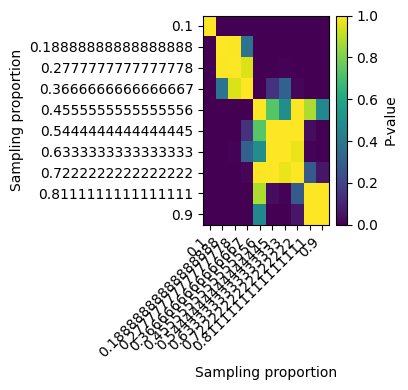

In [ ]:
unique_groups = list(prop_dict.keys()) 
group_pairs = []
for i in range(len(unique_groups)):
    for j in range(i+1, len(unique_groups)):
        group_pairs.append((i, j))

p_values = post_hoc_res.pvalues 

N = len(unique_groups)
p_matrix = np.ones((N, N)) 

for (g1, g2), p in zip(group_pairs, p_values):
    p_matrix[g1, g2] = p
    p_matrix[g2, g1] = p 

plt.figure(figsize=(4, 4))
plt.imshow(p_matrix, cmap='viridis', aspect='auto', vmin=0, vmax=1)
plt.colorbar(label='P-value')
plt.xticks(range(N), unique_groups, rotation=45, ha='right')
plt.yticks(range(N), unique_groups)
plt.xlabel('Sampling proportion')
plt.ylabel('Sampling proportion')
plt.tight_layout()
plt.show()

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/394624054.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/394624054.py:14: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


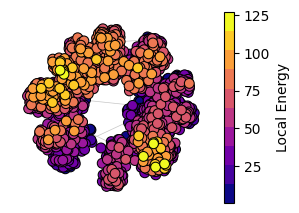

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/394624054.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('viridis', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/394624054.py:32: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


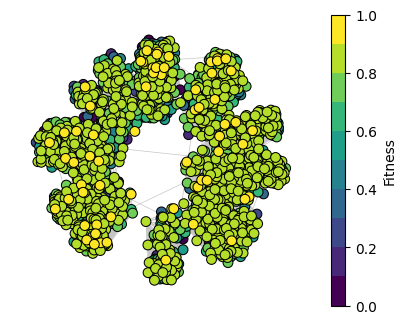

In [ ]:
#Ground truth graph

#Local Dirichlet Energy 
values = [node[1]['local_dirichlet'] for node in G_k_full.nodes(data=True)]
viridis = plt.cm.get_cmap('plasma', 10)
pos = nx.spring_layout(G_k_full, k=0.35)

nodes_sorted_by_value = sorted(G_k_full.nodes(data=True), key=lambda x: x[1]['local_dirichlet'])
node_colors = [viridis((node[1]['local_dirichlet'] - min(values)) / (max(values) - min(values))) for node in nodes_sorted_by_value]
nodes_sorted = [node[0] for node in nodes_sorted_by_value]


fig, ax = plt.subplots(figsize=(3.25, 2.5), constrained_layout=True)
plt.tight_layout()
nx.draw(G_k_full, pos, nodelist=nodes_sorted, node_color=node_colors, with_labels=False, edgecolors='black', node_size=50, width=0.5, edge_color='#C6C6C6', linewidths=0.75)
sm = mpl.cm.ScalarMappable(cmap=viridis, norm=plt.Normalize(vmin=min(values), vmax=max(values)))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Local Energy')
plt.savefig('../figures/figure_3/panel_c.pdf')
plt.show()

#Fitness values
values = [node[1]['value'] for node in G_k_full.nodes(data=True)]
viridis = plt.cm.get_cmap('viridis', 10)

nodes_sorted_by_value = sorted(G_k_full.nodes(data=True), key=lambda x: x[1]['value'])
node_colors = [viridis((node[1]['value'] - min(values)) / (max(values) - min(values))) for node in nodes_sorted_by_value]
nodes_sorted = [node[0] for node in nodes_sorted_by_value]

fig, ax = plt.subplots(figsize=(4.5, 3.5), constrained_layout=True)
plt.tight_layout()
nx.draw(G_k_full, pos, nodelist=nodes_sorted, node_color=node_colors, with_labels=False, edgecolors='black', node_size=50, width=0.5, edge_color='#C6C6C6', linewidths=0.75)

sm = mpl.cm.ScalarMappable(cmap=viridis, norm=plt.Normalize(vmin=min(values), vmax=max(values)))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Fitness')
plt.savefig('../si_figures/si_figure_3/panel_a.pdf')
plt.show()

The below cells compute the local energies for each subgraph sampled from the complete His3p landscape using the `graph_ruggedness_de.compute_local_dirichlet_energy` function.

In [81]:
for key in graph_sampl_repl_dict.keys():
    
#Compute local Dirichlet energies over the full graph.
    graph_ruggedness_de.compute_local_dirichlet_energy(G=graph_sampl_repl_dict[key],
                                                    approximate=True)

Computing local Dirichlet energy.: 202it [00:00, 8286.54it/s]
Computing local Dirichlet energy.: 202it [00:00, 10267.33it/s]
Computing local Dirichlet energy.: 202it [00:00, 10629.95it/s]
Computing local Dirichlet energy.: 202it [00:00, 10714.37it/s]
Computing local Dirichlet energy.: 202it [00:00, 10385.63it/s]
Computing local Dirichlet energy.: 202it [00:00, 11042.10it/s]
Computing local Dirichlet energy.: 202it [00:00, 11077.04it/s]
Computing local Dirichlet energy.: 202it [00:00, 10586.38it/s]
Computing local Dirichlet energy.: 202it [00:00, 11106.37it/s]
Computing local Dirichlet energy.: 202it [00:00, 10720.60it/s]
Computing local Dirichlet energy.: 383it [00:00, 10939.70it/s]
Computing local Dirichlet energy.: 383it [00:00, 10991.27it/s]
Computing local Dirichlet energy.: 383it [00:00, 10869.23it/s]
Computing local Dirichlet energy.: 383it [00:00, 10650.17it/s]
Computing local Dirichlet energy.: 383it [00:00, 10887.80it/s]
Computing local Dirichlet energy.: 383it [00:00, 11265.6

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


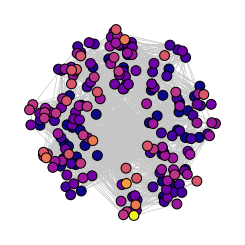

0.3704132121910081 5.7583823700849686e-08
0.3704132121910081
5.7583823700849686e-08


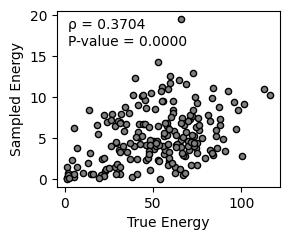

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


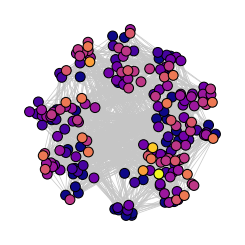

0.3056247320195588 9.730309220516177e-06
0.3056247320195588
9.730309220516177e-06


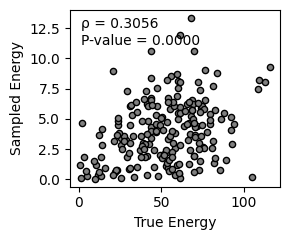

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


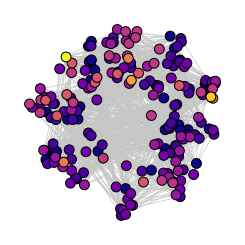

0.395875812858839 5.492033936794373e-09
0.395875812858839
5.492033936794373e-09


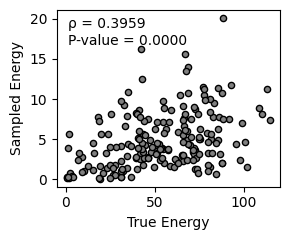

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


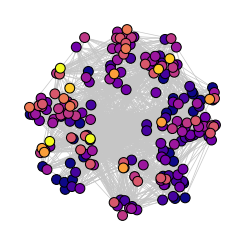

0.4448995814955365 3.2751041523429297e-11
0.4448995814955365
3.2751041523429297e-11


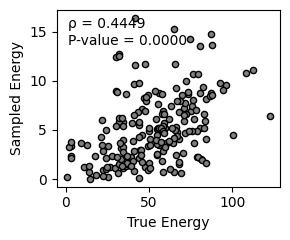

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


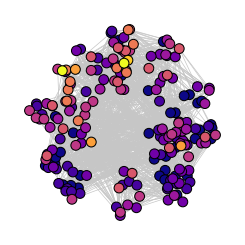

0.380058688171589 2.4206033396195028e-08
0.380058688171589
2.4206033396195028e-08


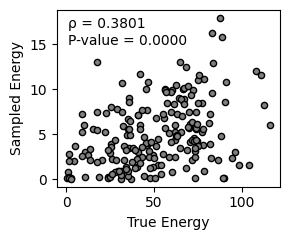

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


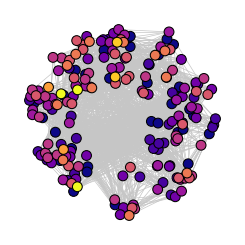

0.41024284032697067 1.3320053550447736e-09
0.41024284032697067
1.3320053550447736e-09


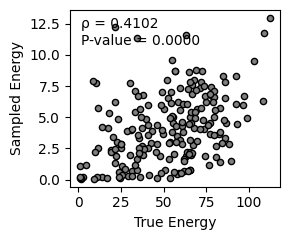

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


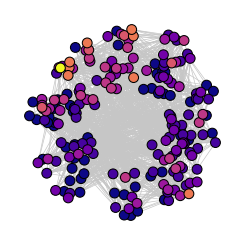

0.536922518073438 1.763510214312232e-16
0.536922518073438
1.763510214312232e-16


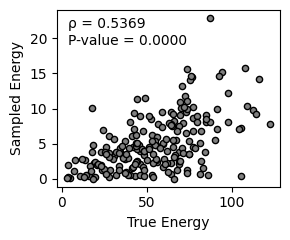

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


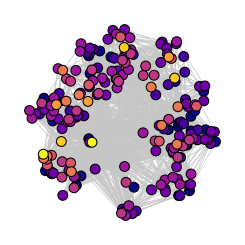

0.2928213636009583 2.347155623967863e-05
0.2928213636009583
2.347155623967863e-05


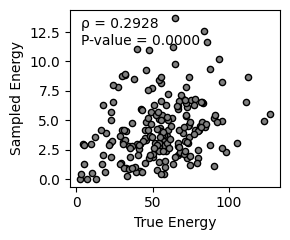

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


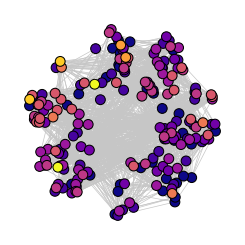

0.33701729852420576 9.369933326569001e-07
0.33701729852420576
9.369933326569001e-07


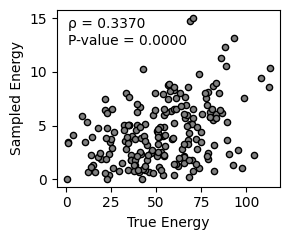

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


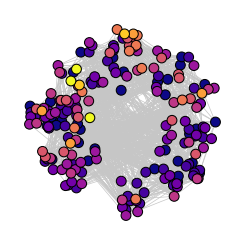

0.3420707999775788 6.270204145428889e-07
0.3420707999775788
6.270204145428889e-07


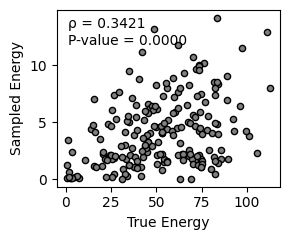

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


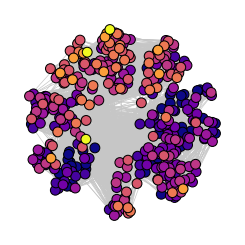

0.5381524852022473 3.8718472089850226e-30
0.5381524852022473
3.8718472089850226e-30


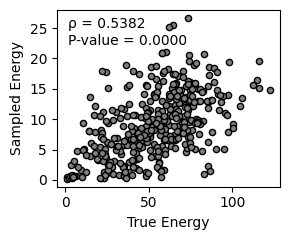

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


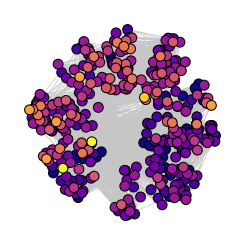

0.4560386279441719 4.551208920608923e-21
0.4560386279441719
4.551208920608923e-21


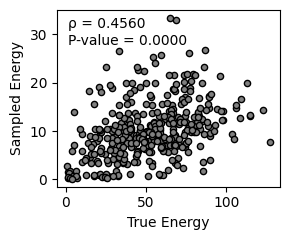

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


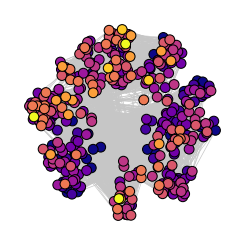

0.5296463405465258 4.423940961220002e-29
0.5296463405465258
4.423940961220002e-29


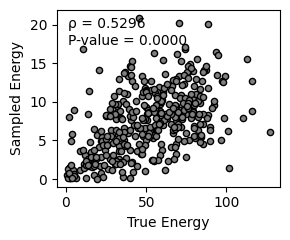

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


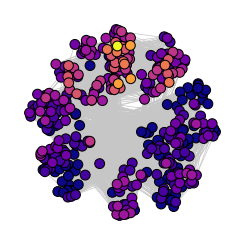

0.5363839316227633 6.461706425465802e-30
0.5363839316227633
6.461706425465802e-30


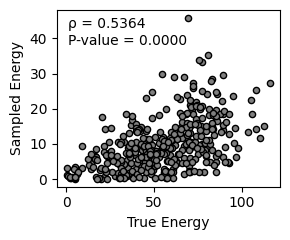

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


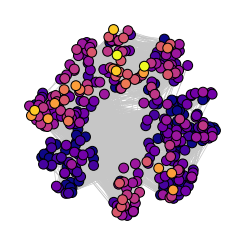

0.5934838625893676 8.170953327960581e-38
0.5934838625893676
8.170953327960581e-38


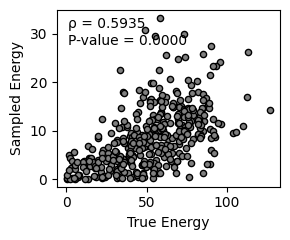

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


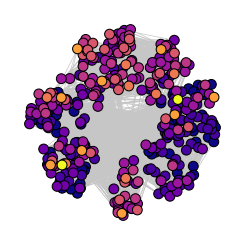

0.5781352524845188 1.5449290886782697e-35
0.5781352524845188
1.5449290886782697e-35


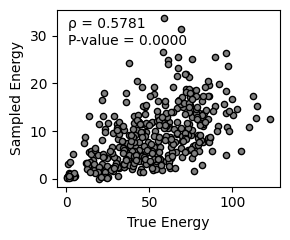

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


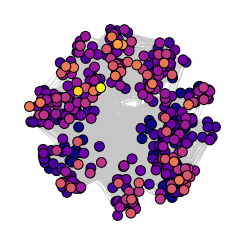

0.4358062041201318 3.4756572739301918e-19
0.4358062041201318
3.4756572739301918e-19


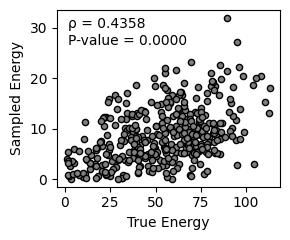

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


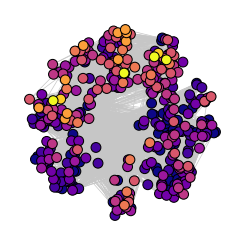

0.5880160844394626 5.460483693200014e-37
0.5880160844394626
5.460483693200014e-37


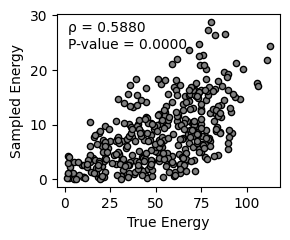

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


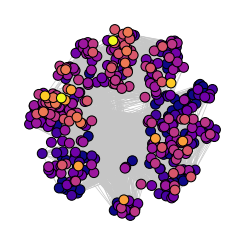

0.6076314368515304 5.045548535522557e-40
0.6076314368515304
5.045548535522557e-40


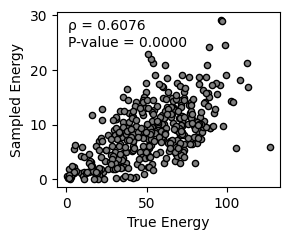

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


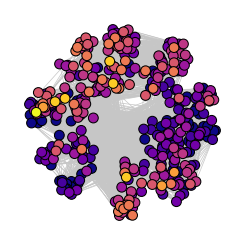

0.5739738117370444 6.10465147852993e-35
0.5739738117370444
6.10465147852993e-35


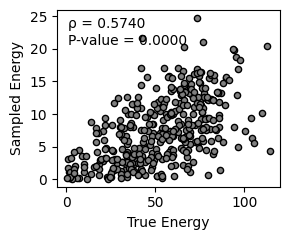

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


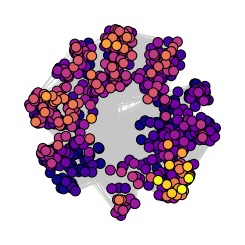

0.5406057877967454 4.819998411101172e-44
0.5406057877967454
4.819998411101172e-44


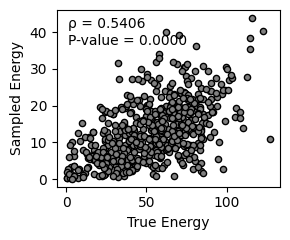

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


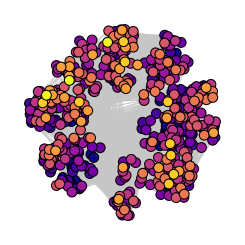

0.4919796017532551 1.1832788497468752e-35
0.4919796017532551
1.1832788497468752e-35


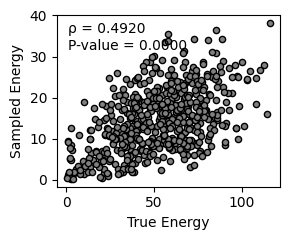

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


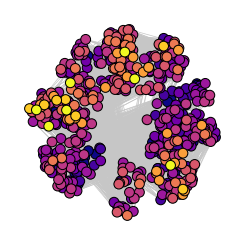

0.5748228676299411 8.00817416044652e-51
0.5748228676299411
8.00817416044652e-51


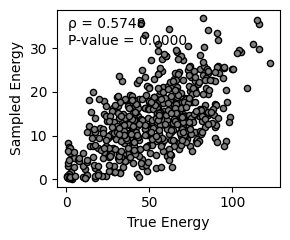

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


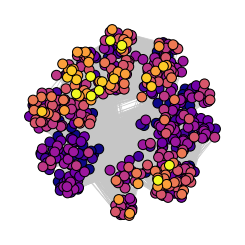

0.5888650872882014 7.64416598038142e-54
0.5888650872882014
7.64416598038142e-54


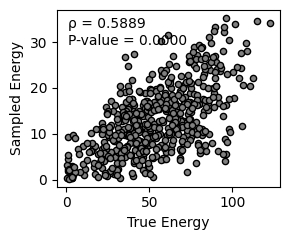

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


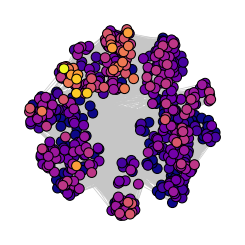

0.47804228367512197 1.7342197669964277e-33
0.47804228367512197
1.7342197669964277e-33


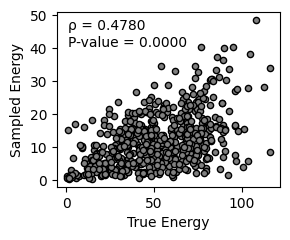

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


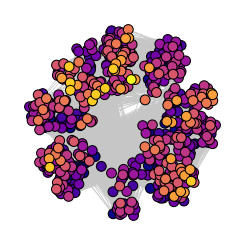

0.42706731090582384 2.3073186077761925e-26
0.42706731090582384
2.3073186077761925e-26


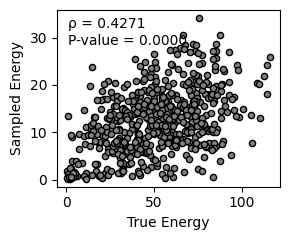

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


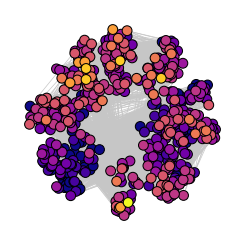

0.4961913329507564 2.5043041252438918e-36
0.4961913329507564
2.5043041252438918e-36


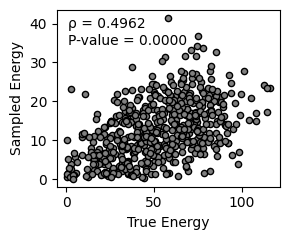

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


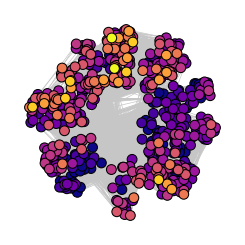

0.626900450148819 8.174725956101934e-63
0.626900450148819
8.174725956101934e-63


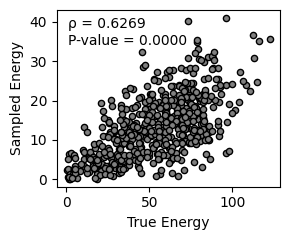

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


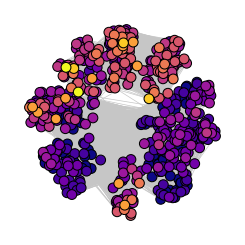

0.5610851987770629 5.252786756829214e-48
0.5610851987770629
5.252786756829214e-48


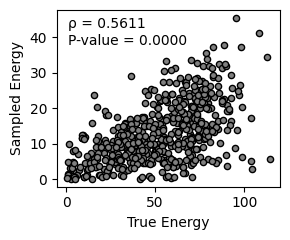

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


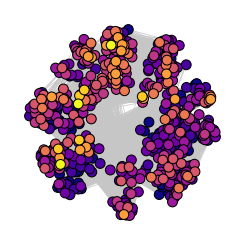

0.5022327897862442 2.598784929698244e-37
0.5022327897862442
2.598784929698244e-37


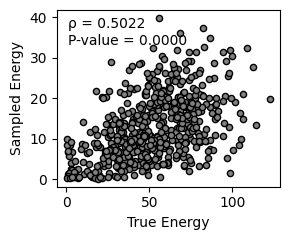

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


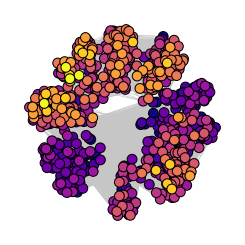

0.7197471154418897 1.4658910521131303e-119
0.7197471154418897
1.4658910521131303e-119


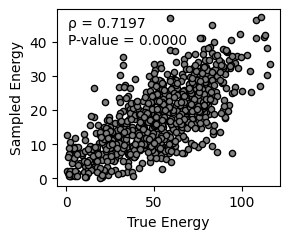

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


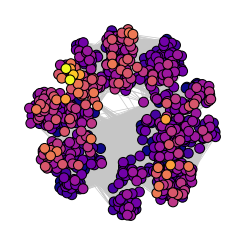

0.5972690887783999 5.003712638783305e-73
0.5972690887783999
5.003712638783305e-73


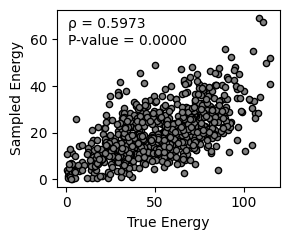

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


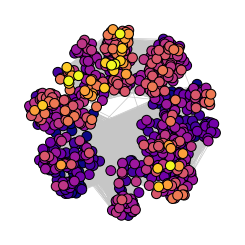

0.6245146276121113 1.3497425891299712e-81
0.6245146276121113
1.3497425891299712e-81


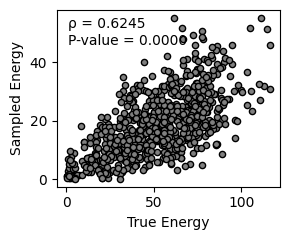

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


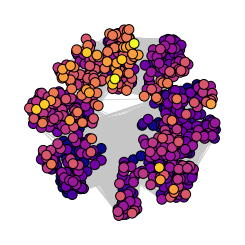

0.6287008748610192 5.463586611419605e-83
0.6287008748610192
5.463586611419605e-83


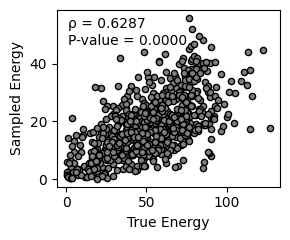

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


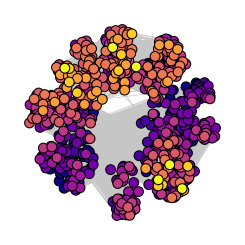

0.7451271134126906 1.714047171910375e-132
0.7451271134126906
1.714047171910375e-132


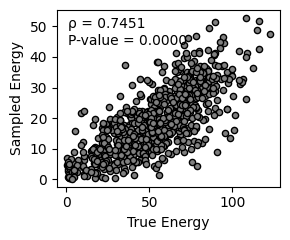

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


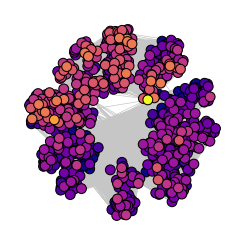

0.7134912956834581 1.3669144888053013e-116
0.7134912956834581
1.3669144888053013e-116


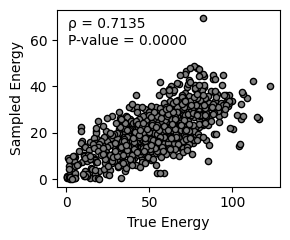

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


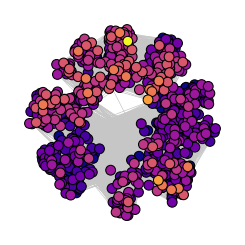

0.6411487654593322 2.9323078461751774e-87
0.6411487654593322
2.9323078461751774e-87


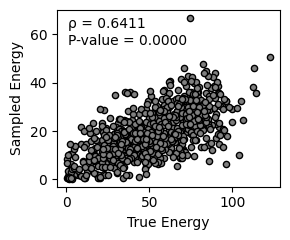

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


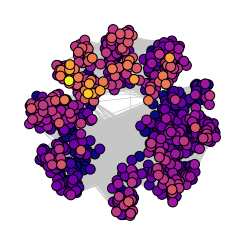

0.7087984507871807 2.048803552796281e-114
0.7087984507871807
2.048803552796281e-114


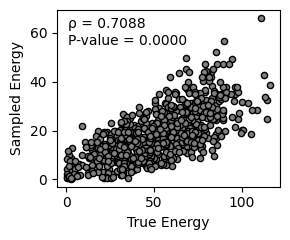

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


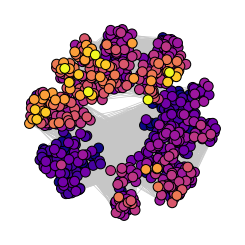

0.694037080045588 7.605071332148743e-108
0.694037080045588
7.605071332148743e-108


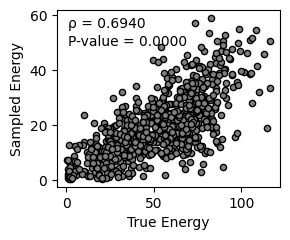

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


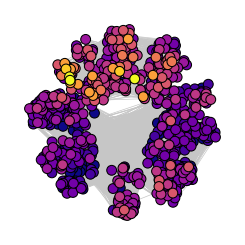

0.6987867109220885 6.474999647841899e-110
0.6987867109220885
6.474999647841899e-110


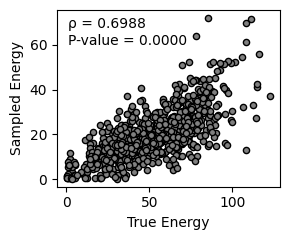

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


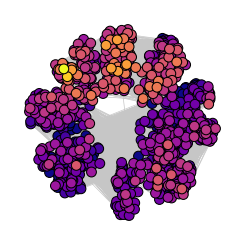

0.6927128964646914 7.16815362627332e-133
0.6927128964646914
7.16815362627332e-133


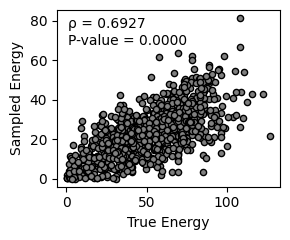

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


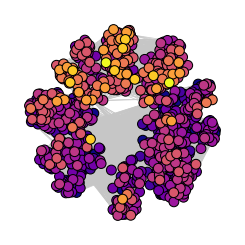

0.6423360330970852 1.6100827838403322e-108
0.6423360330970852
1.6100827838403322e-108


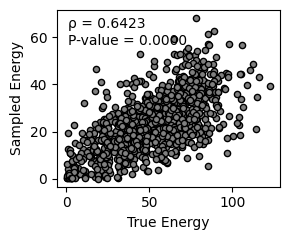

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


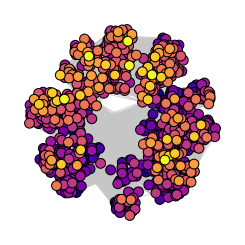

0.6212069528955662 1.2895572914837916e-99
0.6212069528955662
1.2895572914837916e-99


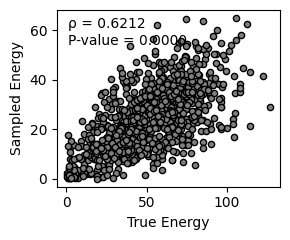

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


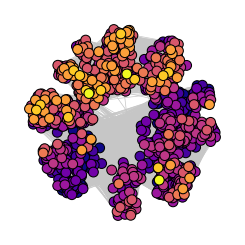

0.7200158919629758 2.688648576079523e-148
0.7200158919629758
2.688648576079523e-148


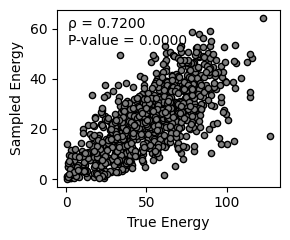

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


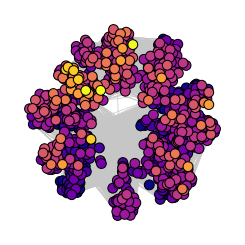

0.6467047357945894 1.893844007973572e-110
0.6467047357945894
1.893844007973572e-110


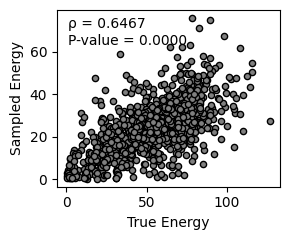

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


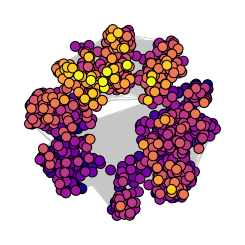

0.638711308550299 6.081666901260154e-107
0.638711308550299
6.081666901260154e-107


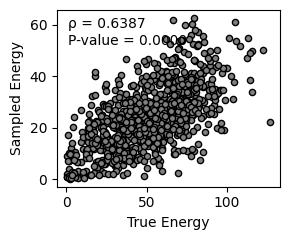

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


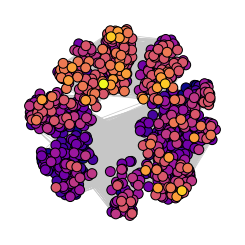

0.63966277222823 2.355506001567243e-107
0.63966277222823
2.355506001567243e-107


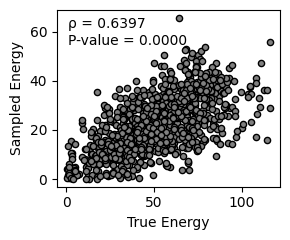

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


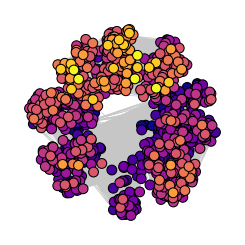

0.7058351046771808 4.609041700777799e-140
0.7058351046771808
4.609041700777799e-140


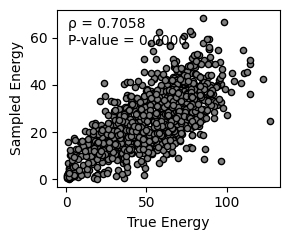

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


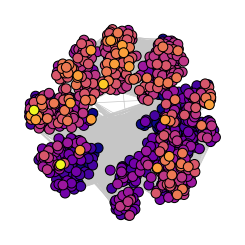

0.61182741977707 7.053641916954374e-96
0.61182741977707
7.053641916954374e-96


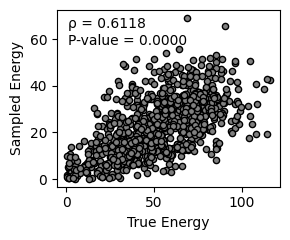

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


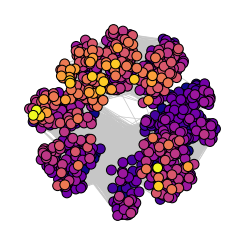

0.7098106897532518 2.543571586705686e-142
0.7098106897532518
2.543571586705686e-142


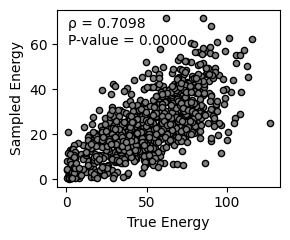

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


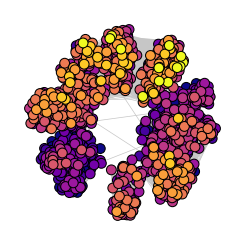

0.7967565876977086 2.629376592936055e-243
0.7967565876977086
2.629376592936055e-243


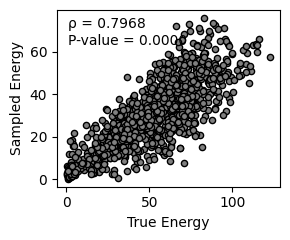

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


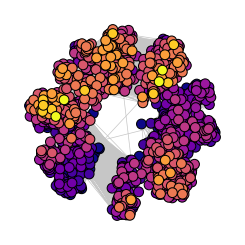

0.795488089018753 5.500657660980561e-242
0.795488089018753
5.500657660980561e-242


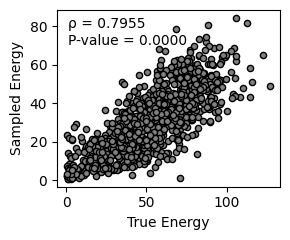

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


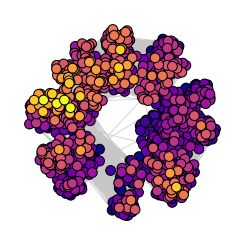

0.8046594438040229 9.447905776644898e-252
0.8046594438040229
9.447905776644898e-252


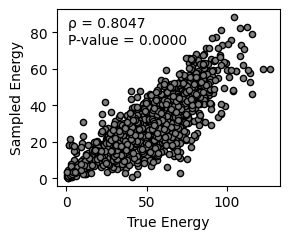

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


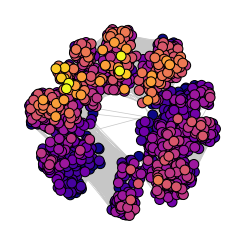

0.8269709762636518 7.599105212952457e-278
0.8269709762636518
7.599105212952457e-278


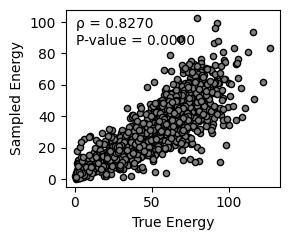

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


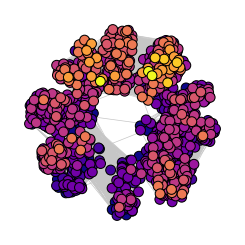

0.8105368560945424 2.752739855636085e-258
0.8105368560945424
2.752739855636085e-258


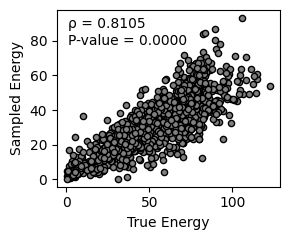

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


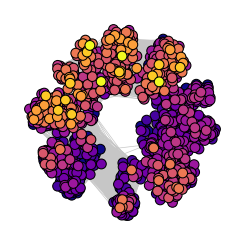

0.823074354652033 5.024159063891671e-273
0.823074354652033
5.024159063891671e-273


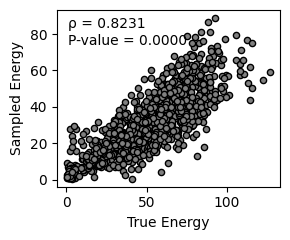

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


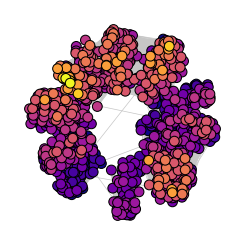

0.8093351899715852 6.2297582643592614e-257
0.8093351899715852
6.2297582643592614e-257


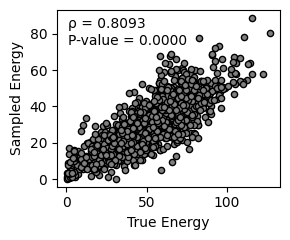

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


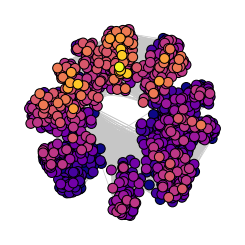

0.8543795122454116 1.45205013e-315
0.8543795122454116
1.45205013e-315


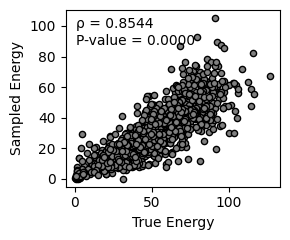

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


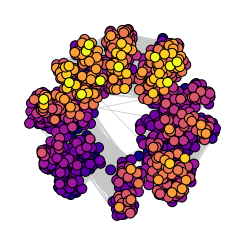

0.792897404446122 2.562016149508464e-239
0.792897404446122
2.562016149508464e-239


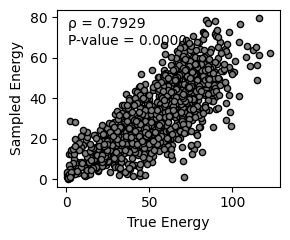

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


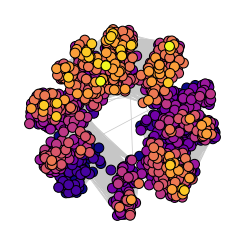

0.823787128231645 6.733452758197842e-274
0.823787128231645
6.733452758197842e-274


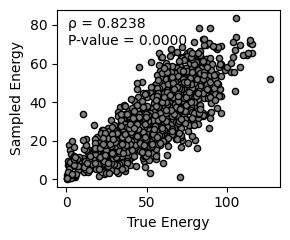

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


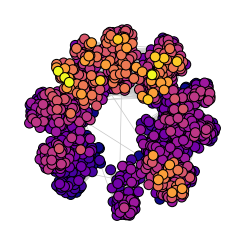

0.8509127675499402 0.0
0.8509127675499402
0.0


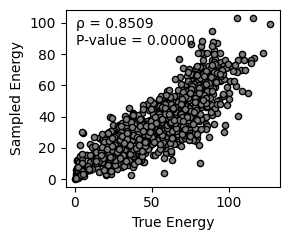

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


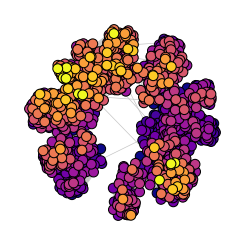

0.8727857318527305 0.0
0.8727857318527305
0.0


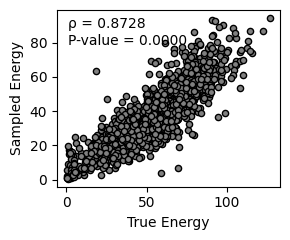

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


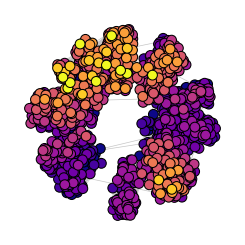

0.8829198607292938 0.0
0.8829198607292938
0.0


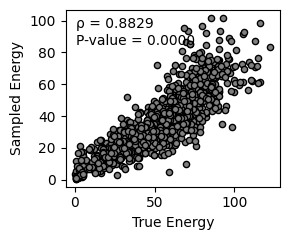

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


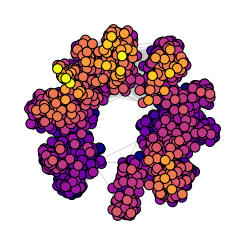

0.8645925394240227 0.0
0.8645925394240227
0.0


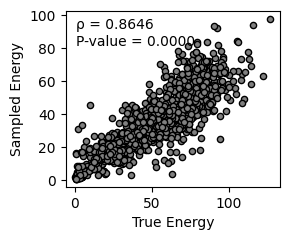

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


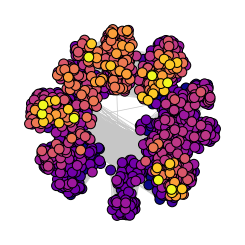

0.7623134201974948 1.6742504807088616e-244
0.7623134201974948
1.6742504807088616e-244


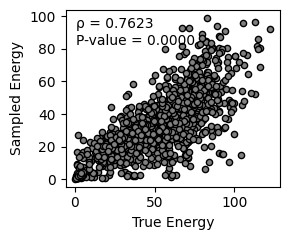

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


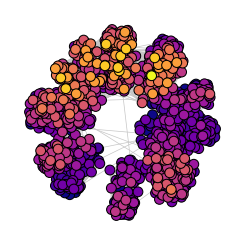

0.8708744655832025 0.0
0.8708744655832025
0.0


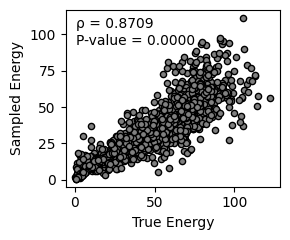

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


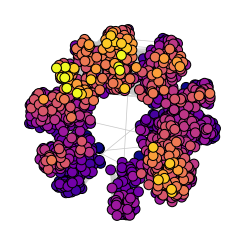

0.8367543103742707 0.0
0.8367543103742707
0.0


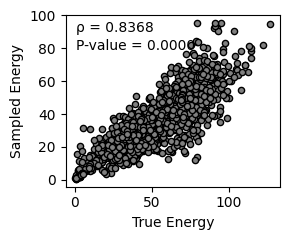

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


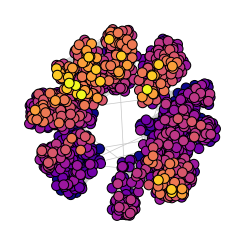

0.8724930888863612 0.0
0.8724930888863612
0.0


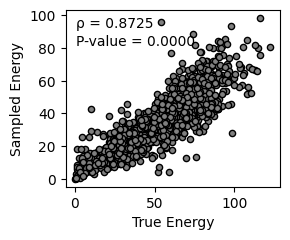

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


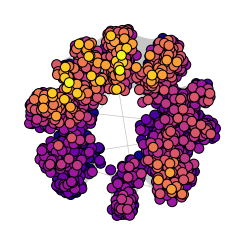

0.8369905607281064 0.0
0.8369905607281064
0.0


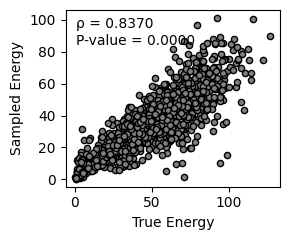

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


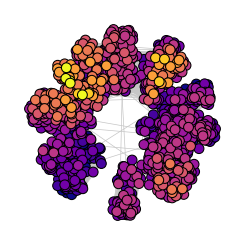

0.876497763668413 0.0
0.876497763668413
0.0


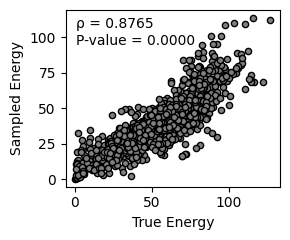

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


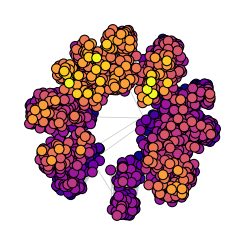

0.8920720887889833 0.0
0.8920720887889833
0.0


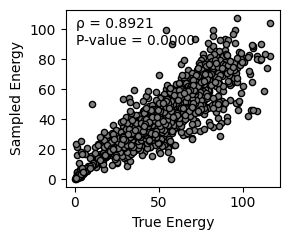

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


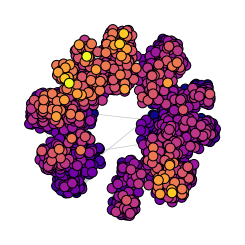

0.928037491224539 0.0
0.928037491224539
0.0


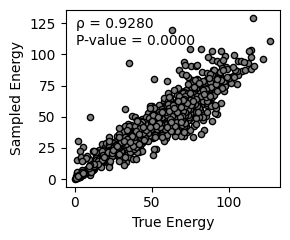

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


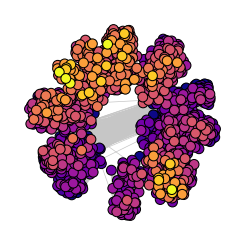

0.9316524629478307 0.0
0.9316524629478307
0.0


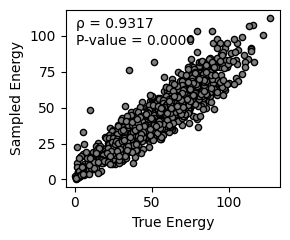

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


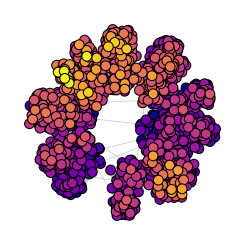

0.930068437983052 0.0
0.930068437983052
0.0


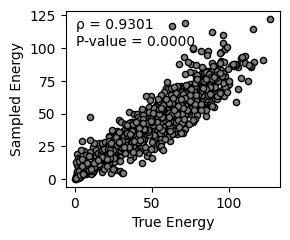

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


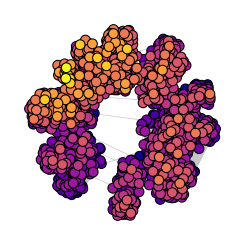

0.9070819141310652 0.0
0.9070819141310652
0.0


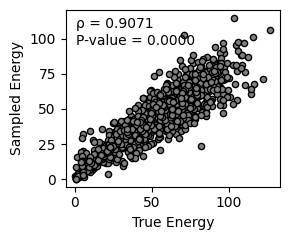

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


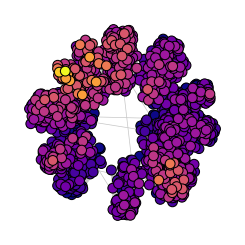

0.9409422423318717 0.0
0.9409422423318717
0.0


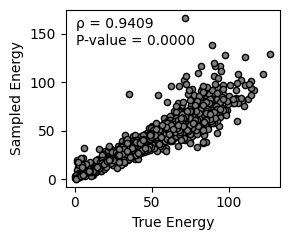

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


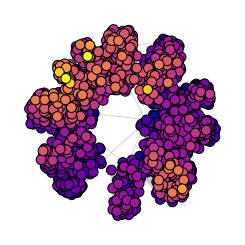

0.9398553299980623 0.0
0.9398553299980623
0.0


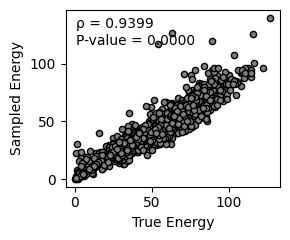

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


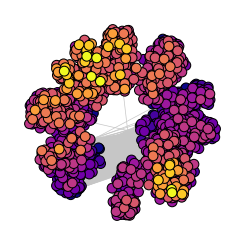

0.923487254322946 0.0
0.923487254322946
0.0


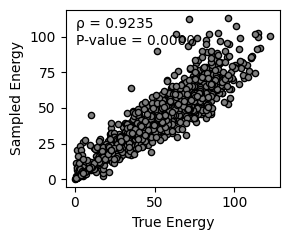

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


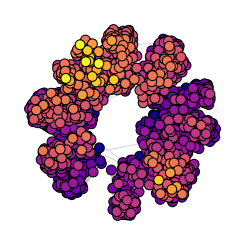

0.9302125817537186 0.0
0.9302125817537186
0.0


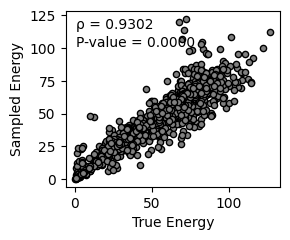

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


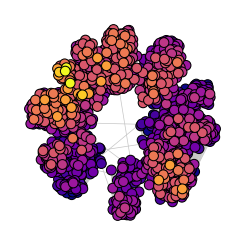

0.9238327542176041 0.0
0.9238327542176041
0.0


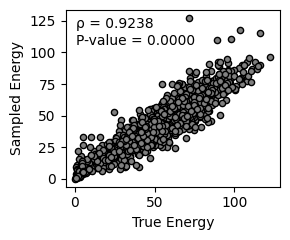

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


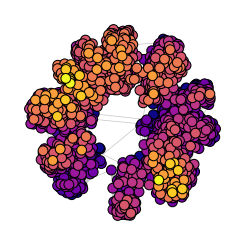

0.9879438426112269 0.0
0.9879438426112269
0.0


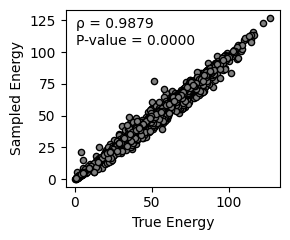

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


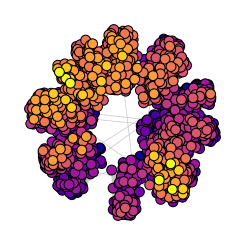

0.9831414917511445 0.0
0.9831414917511445
0.0


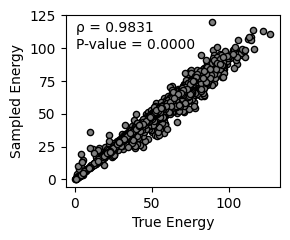

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


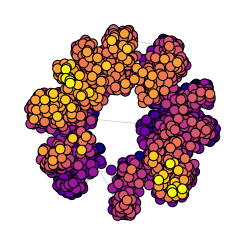

0.9879206301148936 0.0
0.9879206301148936
0.0


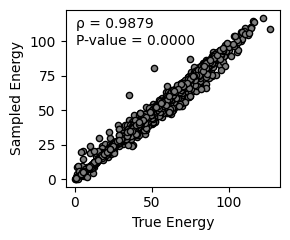

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


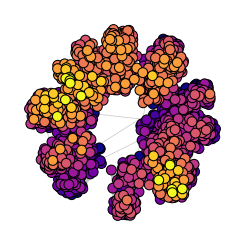

0.9886973966719492 0.0
0.9886973966719492
0.0


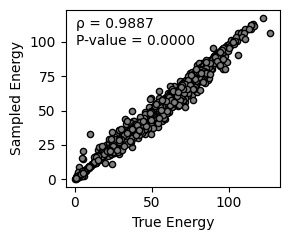

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


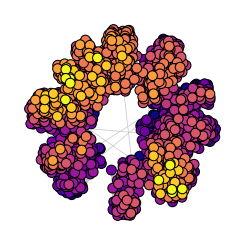

0.9799030554869542 0.0
0.9799030554869542
0.0


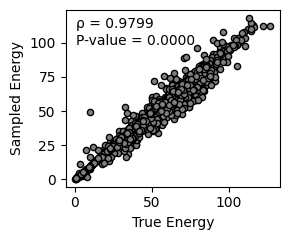

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


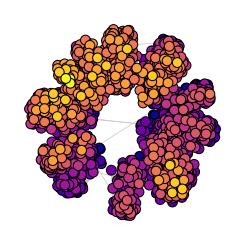

0.9821768592639042 0.0
0.9821768592639042
0.0


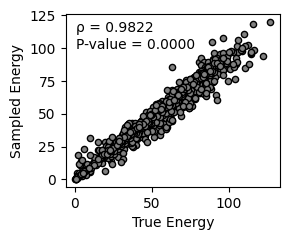

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


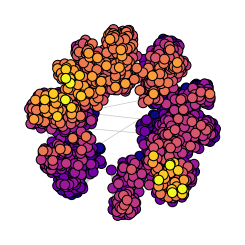

0.9834141352813756 0.0
0.9834141352813756
0.0


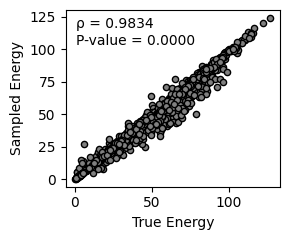

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


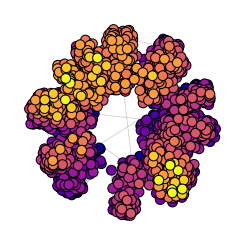

0.9855055636464707 0.0
0.9855055636464707
0.0


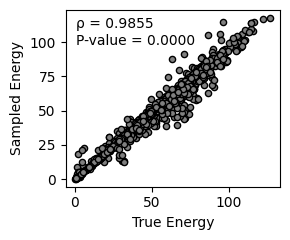

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


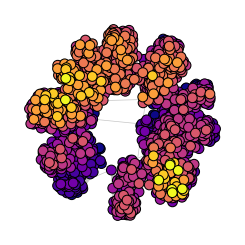

0.9710038678176482 0.0
0.9710038678176482
0.0


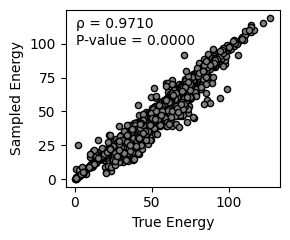

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


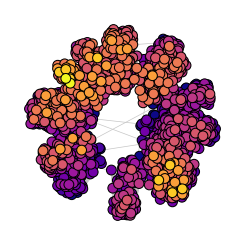

0.986699131573115 0.0
0.986699131573115
0.0


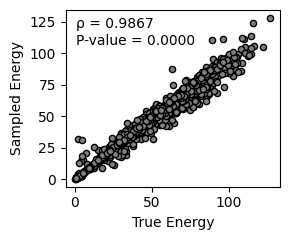

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


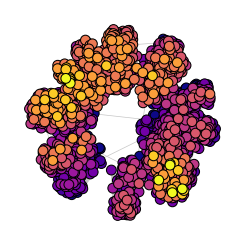

1.0 0.0
1.0
0.0


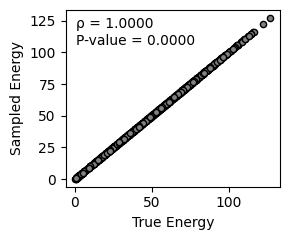

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


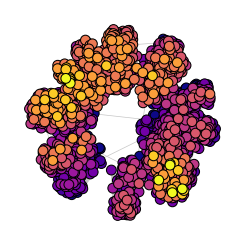

1.0 0.0
1.0
0.0


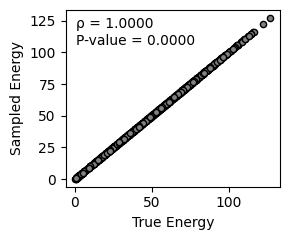

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


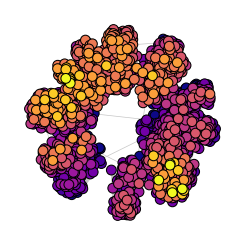

1.0 0.0
1.0
0.0


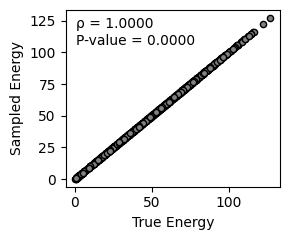

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


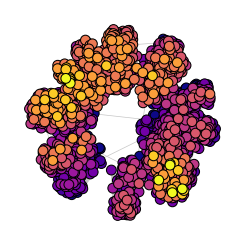

1.0 0.0
1.0
0.0


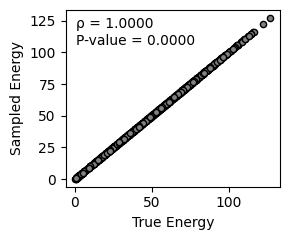

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


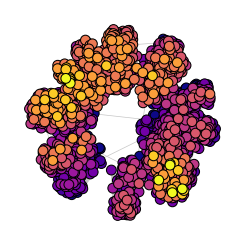

1.0 0.0
1.0
0.0


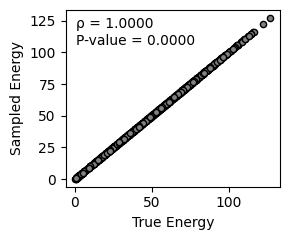

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


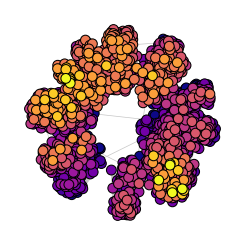

1.0 0.0
1.0
0.0


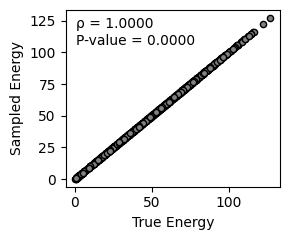

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


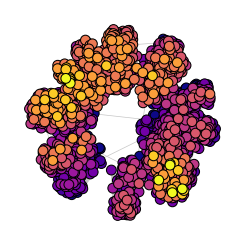

1.0 0.0
1.0
0.0


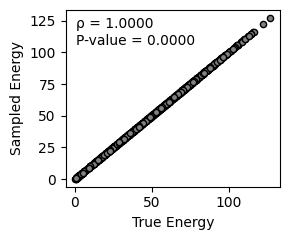

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


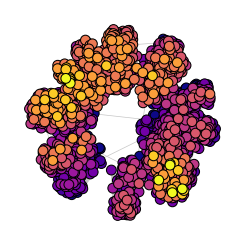

1.0 0.0
1.0
0.0


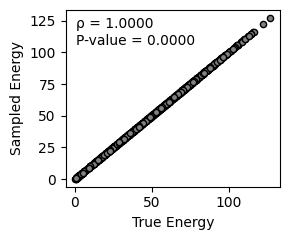

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


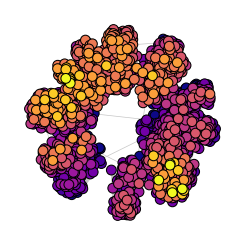

1.0 0.0
1.0
0.0


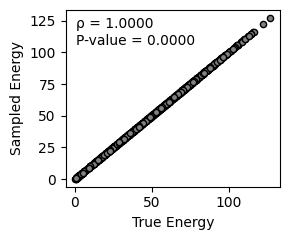

/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('plasma', 10)
/var/folders/dm/sqfv0msd3g50txf84szl1c4m0000gn/T/ipykernel_36185/889838138.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


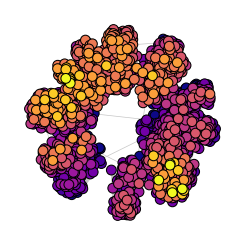

1.0 0.0
1.0
0.0


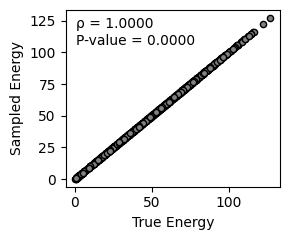

In [82]:
#Sampled graph

#Local ruggedness values

for key in graph_sampl_repl_dict.keys():

    values = [node[1]['local_dirichlet'] for node in graph_sampl_repl_dict[key].nodes(data=True)]
    viridis = plt.cm.get_cmap('plasma', 10)

    nodes_sorted_by_value = sorted(graph_sampl_repl_dict[key].nodes(data=True), key=lambda x: x[1]['local_dirichlet'])
    node_colors = [viridis((node[1]['local_dirichlet'] - min(values)) / (max(values) - min(values))) for node in nodes_sorted_by_value]
    nodes_sorted = [node[0] for node in nodes_sorted_by_value]

    plt.figure(figsize=(2.25, 2.25))

    nx.draw(graph_sampl_repl_dict[key], pos, nodelist=nodes_sorted, node_color=node_colors, with_labels=False, edgecolors='black', node_size=50, width=0.5, edge_color='#C6C6C6', linewidths=0.75)
    plt.tight_layout()
    plt.savefig(f'../figures/figure_3/panel_c-e_His3p_graph_{key[0]}_local_DE.pdf')
    plt.show()


    all_nodes = [node for node in graph_sampl_repl_dict[key].nodes()][0]
    G_k_full.nodes[all_nodes]

    x = []
    y = []
    for node in graph_sampl_repl_dict[key].nodes():
        x.append(G_k_full.nodes[node]['local_dirichlet'])
        y.append(graph_sampl_repl_dict[key].nodes[node]['local_dirichlet'])
    rho, p_value = spearmanr(x, y)
    print(rho, p_value)

    plt.figure(figsize=(3, 2.5))
    plt.scatter(x=x, y=y, color='grey', edgecolors='black', linewidths=1, s=20)
    print(rho)
    print(p_value)
    #plt.text(0.675, 0.9, f'ρ = {rho:.2f}', transform=plt.gca().transAxes, fontsize=8)
    #plt.text(0.6, 0.825, f'ρ = {p_value:.2f}', transform=plt.gca().transAxes, fontsize=8)
    plt.xlabel('True Energy')
    plt.ylabel('Sampled Energy')
    plt.text(0.05, 0.9, f'ρ = {rho:.4f}', transform=plt.gca().transAxes, fontsize=10)
    plt.text(0.05, 0.8, f'P-value = {p_value:.4f}', transform=plt.gca().transAxes, fontsize=10)
    plt.tight_layout()
    plt.savefig(f'../figures/figure_3/panel_c-e_scatter_{key[0]}_log_likelihood.pdf')
    plt.show()


## Simulated data: NK sampling

The effect of sparsity will depend on the ruggedness of the underlying fitness landscape. Therefore, simulation of sparse landscapes is required at various levels of controlled ruggedness (using the Laplacian eigenvectors and NK landscapes).

The below cells simulates fitness landscapes using `generate_nk_lanscapes`, before sampling then at a `sampling_prop` sampling proportion with `graph_ruggedness_de.sample_graph` and measuring the how well the evidence supports H0 and H1 using the Bayes factor. 

In [84]:
gnk_dict = {}


k_list = list(range(7))

#Iterate through Laplacian eigenvectors.
for k in k_list:
    Gnk = nk_landscape.generate_nk_landscape_amino_acids(N=8, K=k, amino_acids=['A', 'D'])
    gnk_dict[k] = Gnk


bfs_dict = {}

for sample_a in set(k_list):
    for sample_b in set(k_list):
        if sample_a == sample_b:
            bfs_dict[(sample_a, sample_b)] = np.nan
        else:
            graph_a = gnk_dict[sample_a]
            graph_b = gnk_dict[sample_b]

            BF, log_evidence_H0, log_evidence_H1 = compute_bayes_factor(G1=graph_a,
                                                                        G2=graph_b,
                                                                        t_min=0.1, 
                                                                        t_max=10,
                                                                        verbose=True)
            bfs_dict[(sample_a, sample_b)] = BF
        


Optimization success: True, t_map=10.0000, f(t_map)=-1137.3687
Optimization success: True, t_map=10.0000, f(t_map)=-1168.0559
Joint optimization success: True, t_joint_map=10.0000, f(t_joint_map)=-2305.4245
Log Evidence (H₀): 2299.583218032393
Log Evidence (H₁): 2294.444511291831
Bayes Factor (BF): 170.49513124391802
Optimization success: True, t_map=10.0000, f(t_map)=-1137.3687
Optimization success: True, t_map=9.0092, f(t_map)=-710.7651
Joint optimization success: True, t_joint_map=10.0000, f(t_joint_map)=-1812.2361
Log Evidence (H₀): 1807.3940176538729
Log Evidence (H₁): 1841.4720495353436
Bayes Factor (BF): 1.5852537885015613e-15
Optimization success: True, t_map=10.0000, f(t_map)=-1137.3687
Optimization success: True, t_map=6.2238, f(t_map)=-454.2307
Joint optimization success: True, t_joint_map=7.2862, f(t_joint_map)=-1276.6165
Log Evidence (H₀): 1275.1119120467092
Log Evidence (H₁): 1584.9833992583594
Bayes Factor (BF): 2.6578043312359444e-135
Optimization success: True, t_map=1

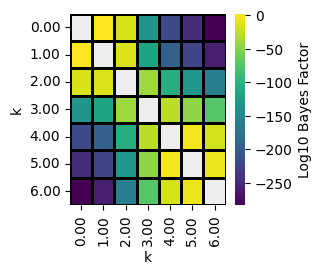

In [88]:
x_vals = sorted({k[0] for k in bfs_dict.keys()})
y_vals = sorted({k[1] for k in bfs_dict.keys()})

df = pd.DataFrame(index=x_vals, columns=y_vals)

for (x, y), bf in bfs_dict.items():
    df.loc[x, y] = np.log10(bf)

df = df.astype(float)

df.index = [round(val, 2) for val in df.index]
df.columns = [round(val, 2) for val in df.columns.tolist()]

cmap = sns.color_palette("viridis", as_cmap=True)
cmap.set_bad(color='#EDEDED')

plt.figure(figsize=(3.25, 2.85))
ax = sns.heatmap(
    df,
    annot=False,
    cmap=cmap,
    linewidths=1,
    linecolor='black',
)

ax.set_xticklabels([f"{float(label):.2f}" for label in df.columns], rotation=90)
ax.set_yticklabels([f"{float(label):.2f}" for label in df.index], rotation=0)


cbar = ax.collections[0].colorbar
cbar.set_label("Log10 Bayes Factor")

for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1)

plt.xlabel("k")
plt.ylabel("k")
plt.tight_layout()
plt.savefig('../si_figures/si_figure_6/panel_a.pdf')
plt.show()

The below cells sample different graph proportions, at different values of `k`.

In [ ]:



sampling_props = np.linspace(0.1, 0.9, 10)

gnk_dict = {}
    

k_list = list(range(7))

#Iterate through k.
for k in k_list:
    prop_dict = {}
    Gnk = nk_landscape.generate_nk_landscape_amino_acids(N=8, K=k, amino_acids=['A', 'D'])
    
    #Iterate through sampling proportion.
    for sampling_prop in sampling_props:

        Gnk_sampled, sampled_nodes, sampled_values = graph_ruggedness_de.sample_graph(G=Gnk,
                                                                                        sample_size=sampling_prop)
        prop_dict[sampling_prop] = Gnk_sampled
    
    gnk_dict[k] = prop_dict



In [96]:

k_prop_bfs_dict = {}

for k in k_list:
    prop_dict = gnk_dict[k]
    bfs_dict = {}

    for sample_a in sampling_props:
        for sample_b in sampling_props:
            if sample_a == sample_b:
                bfs_dict[(sample_a, sample_b)] = np.nan
            else:
                graph_a = prop_dict[sample_a]
                graph_b = prop_dict[sample_b]

                BF, log_evidence_H0, log_evidence_H1 = compute_bayes_factor(G1=graph_a,
                                                                            G2=graph_b,
                                                                            t_min=0.1, 
                                                                            t_max=10,
                                                                            verbose=True)
                bfs_dict[(sample_a, sample_b)] = BF

    k_prop_bfs_dict[k] = bfs_dict

Optimization success: True, t_map=1.8926, f(t_map)=-33.7469
Optimization success: True, t_map=1.5508, f(t_map)=-69.0439
Joint optimization success: True, t_joint_map=1.6417, f(t_joint_map)=-102.3718
Log Evidence (H₀): 101.50651096353243
Log Evidence (H₁): 101.82418073335998
Bayes Factor (BF): 0.7278431044865166
Optimization success: True, t_map=1.8926, f(t_map)=-33.7469
Optimization success: True, t_map=2.2724, f(t_map)=-122.4724
Joint optimization success: True, t_joint_map=2.1495, f(t_joint_map)=-155.5331
Log Evidence (H₀): 154.54255644535456
Log Evidence (H₁): 155.06945608341195
Bayes Factor (BF): 0.5904326899587377
Optimization success: True, t_map=1.8926, f(t_map)=-33.7469
Optimization success: True, t_map=2.3725, f(t_map)=-160.6451
Joint optimization success: True, t_joint_map=2.2219, f(t_joint_map)=-193.2178
Log Evidence (H₀): 192.17410653855538
Log Evidence (H₁): 193.1752827326639
Bayes Factor (BF): 0.36744699790855306
Optimization success: True, t_map=1.8926, f(t_map)=-33.7469

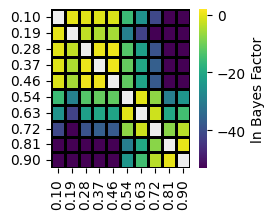

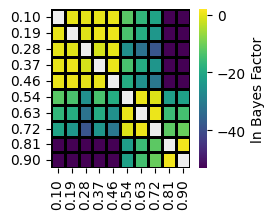

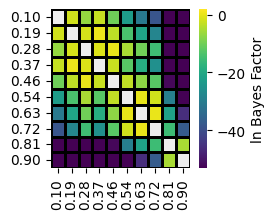

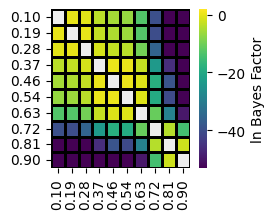

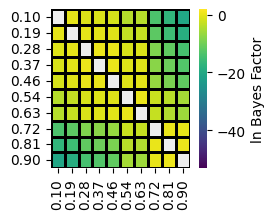

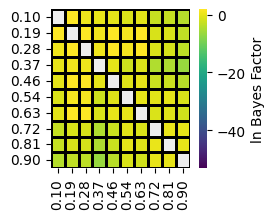

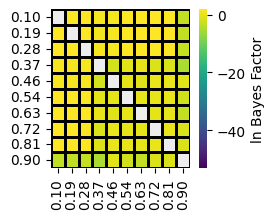

In [118]:
all_log_values = []
for outer_key, inner_dict in k_prop_bfs_dict.items():
    for bf in inner_dict.values():
        if bf is not None and not np.isnan(bf) and bf > 0:
            all_log_values.append(np.log10(bf))

if len(all_log_values) > 0:
    global_min = np.min(all_log_values)
    global_max = np.max(all_log_values)
else:
    global_min, global_max = -1, 1

for outer_key, bfs_dict in k_prop_bfs_dict.items():

    x_vals = sorted({k[0] for k in bfs_dict.keys()})
    y_vals = sorted({k[1] for k in bfs_dict.keys()})

    df = pd.DataFrame(index=x_vals, columns=y_vals)

    for (x, y), bf in bfs_dict.items():
        df.loc[x, y] = np.log(bf) if (bf is not None and not np.isnan(bf) and bf > 0) else np.nan

    df = df.astype(float)

    df.index = [round(val, 2) for val in df.index]
    df.columns = [round(val, 2) for val in df.columns.tolist()]

    cmap = sns.color_palette("viridis", as_cmap=True)
    cmap.set_bad(color='#EDEDED')
    
    plt.figure(figsize=(2.80, 2.30))
    ax = sns.heatmap(
        df,
        annot=False,
        cmap=cmap,
        linewidths=1,
        linecolor='black',
        vmin=global_min,
        vmax=global_max,
        cbar_kws={"label": "ln Bayes Factor"}
    )
    
    ax.set_xticklabels([f"{float(label):.2f}" for label in df.columns], rotation=90)
    ax.set_yticklabels([f"{float(label):.2f}" for label in df.index], rotation=0)

    for spine in ax.spines.values():
        spine.set_edgecolor('black')
        spine.set_linewidth(1)
    
    plt.tight_layout()
    # plt.xlabel("Sampling proportion")
    # plt.ylabel("Sampling proportion")
    plt.savefig(f'../figures/figure_3/panel_d_prop_heatmap_{outer_key}.pdf')
    plt.show()